<H3>    First Name: Balkattu Shreekantha Uttam
<H3>    Last Name: Kannantha
<H3>    USC ID: 9202391620
<H3>    Github UserName: Uttamkannantha

In [1]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn.model_selection import KFold  
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV  

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline

import warnings
warnings.filterwarnings ('ignore')


<h4>(a) Download the APS Failure data from: https://archive.ics.uci.edu/ml/datasets/ APS+Failure+at+Scania+Trucks . The dataset contains a training set and a test
set. The training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column. All attributes are nu- meric.

In [2]:
train = pd.read_csv("../data/aps_failure_training_set.csv", skiprows=20)
test = pd.read_csv("../data/aps_failure_test_set.csv", skiprows=20)

train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [3]:
test

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [4]:
columns = train.columns
columns

Index(['class', 'aa_000', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000',
       'ag_000', 'ag_001', 'ag_002',
       ...
       'ee_002', 'ee_003', 'ee_004', 'ee_005', 'ee_006', 'ee_007', 'ee_008',
       'ee_009', 'ef_000', 'eg_000'],
      dtype='object', length=171)

<h4>(b) Data Preparation
This data set has missing values. When the number of data with missing values
is significant, discarding them is not a good idea.

<h4>i. Research what types of techniques are usually used for dealing with data with missing values. Pick at least one of them and apply it to this data in the next steps.

Some of the popular methods to handle missing values are: <br>
1. Delete the Data
2. Imputing Averages
3. Assigning New Category
4. Certain Algorithms (doing nothing): as certain algorithms work well even with missing values
    

I will fill the missing value with mean 

<h4>ii. For each of the 170 features, calculate the coefficient of variation CV = ms , where s is sample standard deviation and m is sample mean.

In [5]:
train = train.replace({"neg": 0})
train = train.replace({"pos":1})
train = train.replace({"na": np.nan})

test = test.replace({"neg": 0, "pos":1, 'na': np.nan})

train.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [6]:
test.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,0,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,0,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,0,59816,NaN,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,0,1814,NaN,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0


In [7]:
#combinig the datasets to handle missing values
dfCombined = pd.concat([train, test])
dfCombined

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,81852,NaN,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,0,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,0,79636,NaN,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,0,110,NaN,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [8]:
#filling the missing data with mean of the col
filler = SimpleImputer(missing_values = np.nan, strategy = "mean")
filler = filler.fit(dfCombined)

imputedFrame = pd.DataFrame(filler.transform(dfCombined))
imputedFrame.columns = dfCombined.columns

imputedFrame

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0.0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0.0,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0.0,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0.0,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0.0,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0.0,81852.0,0.72556,2.130706e+09,892.000000,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0.0,18.0,0.00000,5.200000e+01,46.000000,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0.0,79636.0,0.72556,1.670000e+03,1518.000000,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0.0,110.0,0.72556,3.600000e+01,32.000000,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [9]:
#Calculate cv
data_X = imputedFrame.columns.to_list()[1:]
cvValues = []

for column in data_X:
    cv = np.std(imputedFrame[column])/np.mean(imputedFrame[column])
    
    cvValues.append([column, cv])

cvValues = pd.DataFrame(cvValues, columns=["Feature", "Coefficient of Variation"])

print(cvValues)

    Feature  Coefficient of Variation
0    aa_000                  4.328579
1    ab_000                  2.178258
2    ac_000                  2.167639
3    ad_000                206.720140
4    ae_000                 22.293524
..      ...                       ...
165  ee_007                  4.885066
166  ee_008                  3.335015
167  ee_009                  5.753895
168  ef_000                 47.919228
169  eg_000                 45.650650

[170 rows x 2 columns]


<h4>iii. Plot a correlation matrix for your features using pandas or any other tool.

In [10]:
corrMatrix = imputedFrame.corr()
corrMatrix

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
class,1.000000,0.323466,0.019919,-0.028800,-0.000215,0.004686,0.013164,0.018157,0.156942,0.336199,...,0.464822,0.454081,0.442454,0.501789,0.424043,0.176607,0.238959,0.118691,0.011986,0.010307
aa_000,0.323466,1.000000,0.019725,-0.011658,-0.000541,0.025795,0.035994,0.011682,0.076378,0.195161,...,0.414125,0.419912,0.409659,0.419780,0.425679,0.356969,0.259668,0.133764,0.006688,0.010330
ab_000,0.019919,0.019725,1.000000,-0.010898,0.000066,0.024869,0.043276,0.000590,0.006547,0.023484,...,0.025161,0.037052,0.028766,0.034201,0.023921,0.013598,0.002371,0.000506,0.046897,0.075683
ac_000,-0.028800,-0.011658,-0.010898,1.000000,-0.002030,-0.004769,-0.010612,0.015534,-0.002333,-0.009439,...,-0.009808,-0.006437,-0.007962,-0.008115,-0.014680,-0.018631,0.010435,0.017293,-0.006191,0.015826
ad_000,-0.000215,-0.000541,0.000066,-0.002030,1.000000,-0.000195,-0.000236,-0.000038,-0.000034,-0.000093,...,-0.000883,-0.000921,-0.000908,-0.000730,-0.000745,-0.000462,-0.000794,-0.000500,-0.000082,-0.000091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ee_007,0.176607,0.356969,0.013598,-0.018631,-0.000462,0.036619,0.046482,0.007631,0.068003,0.181967,...,0.442199,0.432911,0.419633,0.380132,0.543449,1.000000,0.227098,0.063065,-0.000309,0.000946
ee_008,0.238959,0.259668,0.002371,0.010435,-0.000794,-0.008393,-0.010843,0.000067,0.005353,0.009109,...,0.442532,0.470574,0.448390,0.394020,0.365686,0.227098,1.000000,0.690147,-0.005173,-0.001950
ee_009,0.118691,0.133764,0.000506,0.017293,-0.000500,-0.006952,-0.008539,-0.001103,-0.003540,-0.009089,...,0.224587,0.235844,0.220785,0.183844,0.158590,0.063065,0.690147,1.000000,-0.003168,-0.001059
ef_000,0.011986,0.006688,0.046897,-0.006191,-0.000082,0.063587,0.093474,-0.000076,0.001140,0.005625,...,0.003718,0.010177,0.002989,0.026924,0.005298,-0.000309,-0.005173,-0.003168,1.000000,0.222579


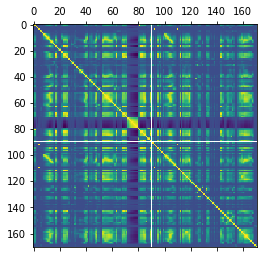

In [11]:
plt.matshow(corrMatrix)
plt.show()

<h4>iv. Pick floor of √170 features with highest CV , and make scatter plots and box plots
for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? This does not mean that you will only use those features in the following questions. We picked them only for visualization.

In [12]:
print("Square root of 170 is: ",math.floor(math.sqrt(170)))

Square root of 170 is:  13


In [13]:
cvValues = cvValues.sort_values("Coefficient of Variation", ascending=False)

#top 13 features
cvValuesTopFeatures = cvValues["Feature"][:13]

cvValuesTopFeatures

91     cf_000
109    co_000
3      ad_000
122    cs_009
138    dj_000
27     as_000
136    dh_000
134    df_000
6      ag_000
29     au_000
19     ak_000
51     az_009
41     ay_009
Name: Feature, dtype: object

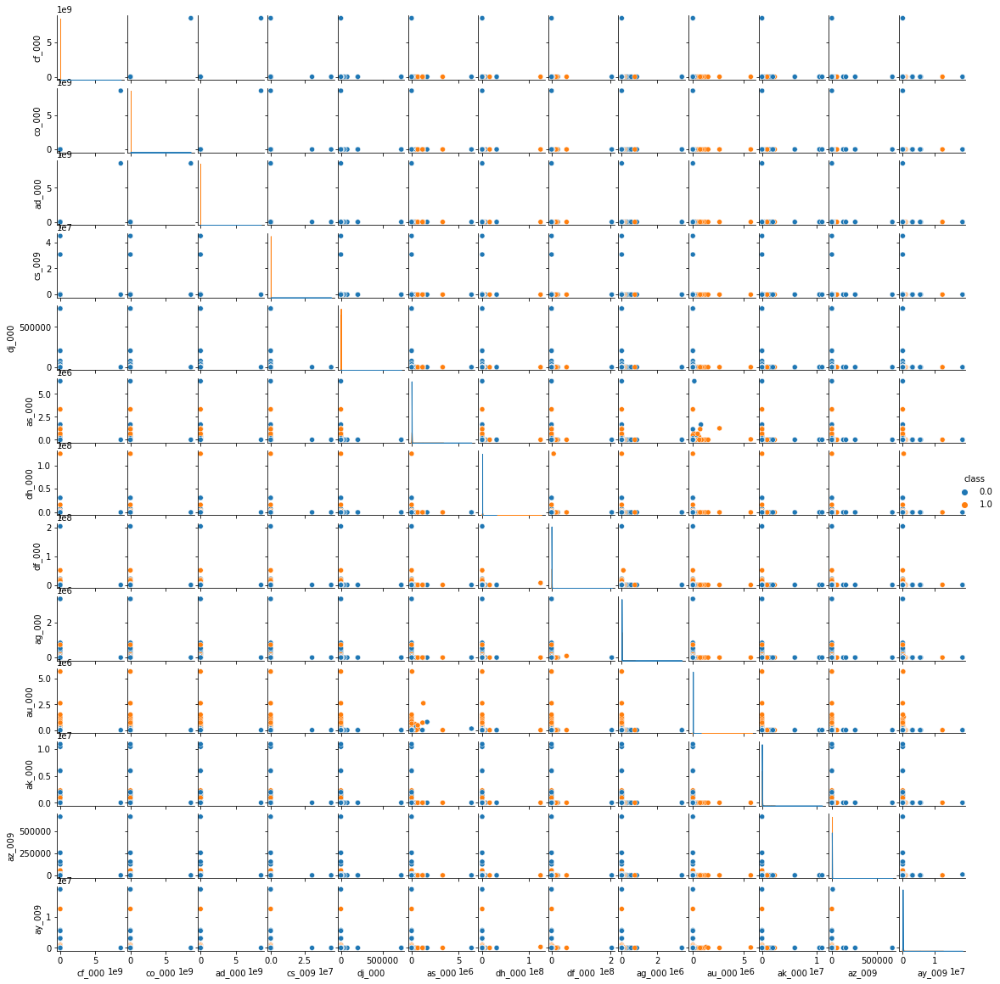

In [14]:
#Draw pair plot for top 13 features
#add class to the top 13 features
cvValuesTopFeatures = cvValuesTopFeatures.append(pd.Series("class"))
figr = sns.pairplot(imputedFrame[cvValuesTopFeatures], diag_kind="kde", hue = "class")

figr.fig.set_size_inches(16,16)


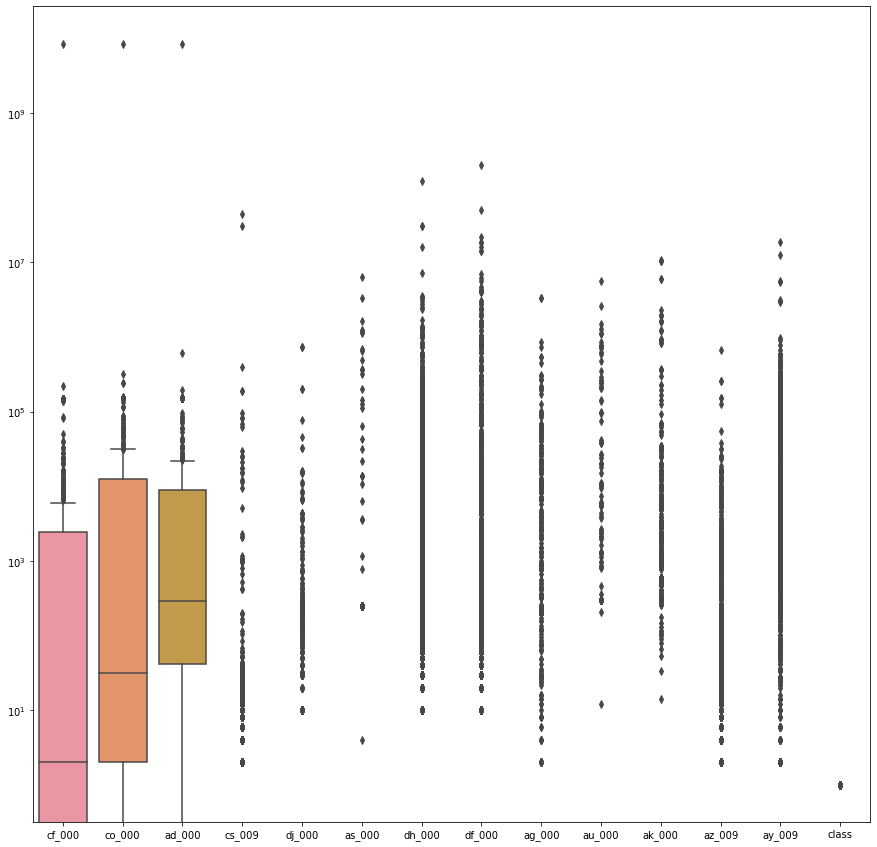

In [15]:
#draw box plot for top 13 features in a same plot
fig, ax = plt.subplots(figsize=(15,15))
sns.boxplot(data=imputedFrame[cvValuesTopFeatures])
#Scale the y-axis
ax.set_yscale('log')
plt.show()

Scatter plots hlep us to understand the co relation between the data but it is defficult to decide the significance of the data with this plot. Box plot will give info on distrubution of the data

 <h4>v. Determine the number of positive and negative data. Is this data set imbalanced?

In [16]:
#count the number of positive and negative classes in imputedFrame

imputedFrame["class"].value_counts()


0.0    74625
1.0     1375
Name: class, dtype: int64

<b>Here 0.0 class means -ve and 1.0 class means +ve.

In [17]:
#calculating %
imputedFrame["class"].value_counts(normalize=True)*100

0.0    98.190789
1.0     1.809211
Name: class, dtype: float64

Yes, dataset in imbalanced. There are 98.1% -ve class and 1.8% +ve class

<h4>(c) Train a random forest to classify the data set. Do NOT compensate for class imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and misclassification for training and test sets and report them (You may use pROC package). Calculate Out of Bag error estimate for your random forset and compare it to the test error.

In [18]:
train = imputedFrame.iloc[:60000, :]
test = imputedFrame.iloc[60000:, :]

In [19]:
train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0.0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0.0,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0.0,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0.0,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0.0,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,153002.0,0.72556,6.640000e+02,186.000000,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,0.0,2286.0,0.72556,2.130707e+09,224.000000,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,0.0,112.0,0.00000,2.130706e+09,18.000000,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,0.0,80292.0,0.72556,2.130706e+09,494.000000,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [20]:
test

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
60000,0.0,60.0,0.00000,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
60001,0.0,82.0,0.00000,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
60002,0.0,66002.0,2.00000,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
60003,0.0,59816.0,0.72556,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
60004,0.0,1814.0,0.72556,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0.0,81852.0,0.72556,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0.0,18.0,0.00000,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0.0,79636.0,0.72556,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0.0,110.0,0.72556,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [21]:
#X and Y values
trainX = train.iloc[:, 1:]
trainY = train.iloc[:,:1]

In [22]:
testX = test.iloc[:, 1:]
testY = test.iloc[:,:1]

In [23]:
#fit random forest classifier on train data
rfc = RandomForestClassifier(n_estimators=100, random_state=0, n_jobs=-1,oob_score=True)

rfc.fit(trainX, trainY)

RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=0)

In [24]:
#Get train accuracy and error
trainPredictions = rfc.predict(trainX)
trainAccuracy = accuracy_score(trainY, trainPredictions)
trainError = 1 - trainAccuracy
confusionMatrix = confusion_matrix(trainY, trainPredictions)

print("Train accuracy:", trainAccuracy)

print("Train error:", trainError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 1.0
Train error: 0.0
Confusion matrix:
[[59000     0]
 [    0  1000]]


In [25]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(trainY, trainPredictions)[0][1] + confusion_matrix(trainY, trainPredictions)[1][0])/len(trainY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.0


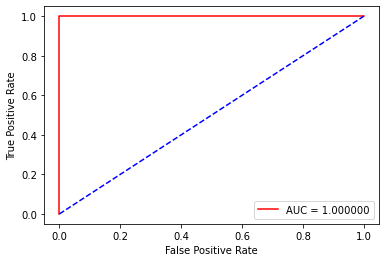

roc Area Under The Curve:  1.0


In [26]:
 #Calculate ROC and AUC
falsePosRate, truePosRate, threshold = roc_curve(trainY, trainPredictions)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)


In [27]:
#Fitting the model on test data

testPredictions = rfc.predict(testX)
testAccuracy = accuracy_score(testY, testPredictions)
testError = 1 - testAccuracy
confusionMatrix = confusion_matrix(testY, testPredictions)

print("Train accuracy:", testAccuracy)

print("Train error:", testError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.992
Train error: 0.008000000000000007
Confusion matrix:
[[15608    17]
 [  111   264]]


In [28]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(testY, testPredictions)[0][1] + confusion_matrix(testY, testPredictions)[1][0])/len(testY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.008


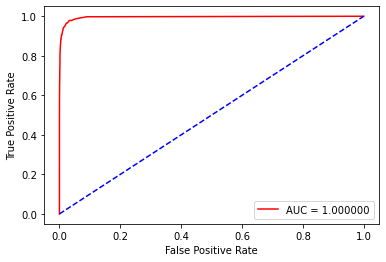

roc Area Under The Curve:  1.0


In [29]:
 #Calculate ROC and AUC
falsePosRate, truePosRate, threshold = roc_curve(testY, testPredictions)

probPredict = rfc.predict_proba(testX)

falsePosRate, truePosRate, threshold = roc_curve(testY, probPredict[:, 1], pos_label=1)


plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)

In [30]:
 #calculate out of bag error for the random forest classifier
print("Out of bag error: ", 1 - rfc.oob_score_)

print()

print("Test error: ", testError)

Out of bag error:  0.006216666666666648

Test error:  0.008000000000000007


Out of bag error is less than test error but very close

<h4>(d) Research how class imbalance is addressed in random forests. Compensate for class imbalance in your random forest and repeat 1c. Compare the results with those of 1c.

In [31]:
rfc = RandomForestClassifier(n_estimators=100, random_state=0, n_jobs=-1,oob_score=True, class_weight='balanced')

rfc.fit(trainX, trainY)

RandomForestClassifier(class_weight='balanced', n_jobs=-1, oob_score=True,
                       random_state=0)

In [32]:
#Get train accuracy and error
trainPredictions = rfc.predict(trainX)
trainAccuracy = accuracy_score(trainY, trainPredictions)
trainError = 1 - trainAccuracy
confusionMatrix = confusion_matrix(trainY, trainPredictions)

print("Train accuracy:", trainAccuracy)

print("Train error:", trainError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 1.0
Train error: 0.0
Confusion matrix:
[[59000     0]
 [    0  1000]]


In [33]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(trainY, trainPredictions)[0][1] + confusion_matrix(trainY, trainPredictions)[1][0])/len(trainY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.0


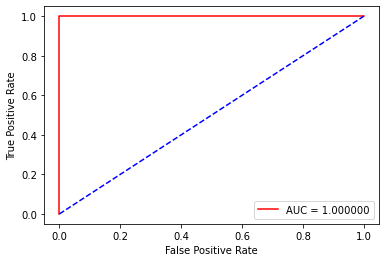

roc Area Under The Curve:  1.0


In [34]:
 #Calculate ROC and AUC
falsePosRate, truePosRate, threshold = roc_curve(trainY, trainPredictions)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)


In [35]:
#Fitting the model on test data

testPredictions = rfc.predict(testX)
testAccuracy = accuracy_score(testY, testPredictions)
testError = 1 - testAccuracy
confusionMatrix = confusion_matrix(testY, testPredictions)

print("Train accuracy:", testAccuracy)

print("Train error:", testError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.9889375
Train error: 0.011062499999999975
Confusion matrix:
[[15614    11]
 [  166   209]]


In [36]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(testY, testPredictions)[0][1] + confusion_matrix(testY, testPredictions)[1][0])/len(testY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.0110625


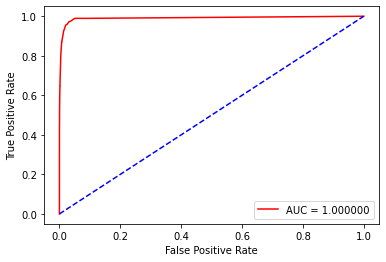

roc Area Under The Curve:  1.0


In [37]:
 #Calculate ROC and AUC
falsePosRate, truePosRate, threshold = roc_curve(testY, testPredictions)

probPredict = rfc.predict_proba(testX)

falsePosRate, truePosRate, threshold = roc_curve(testY, probPredict[:, 1], pos_label=1)


plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)

In [38]:
 #calculate out of bag error for the random forest classifier
print("Out of bag error: ", 1 - rfc.oob_score_)

print()

print("Test error: ", testError)

Out of bag error:  0.007449999999999957

Test error:  0.011062499999999975


By comparing both the balanced vs non balanced Random forest results, for the given data balanced has slightly lower accuracy when compared to other model. But this is algo is better to use as it considers the imbalances in clases in the model generated

<h4>(e) XGBoost and Model Trees

In [39]:
k5Fold = KFold(n_splits = 5)
alphas = [10, 5, 1, 0.1, 0.01, 0]
xgbClassifier = XGBClassifier(objective='binary:logistic')

gridSCV = GridSearchCV(xgbClassifier, {'reg_alpha': alphas}, cv = k5Fold, scoring="roc_auc", n_jobs=-1)


In [40]:
gridSCV.fit(trainX, trainY)


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constra...
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=-1, param_grid={'reg_alpha': [10, 5, 1, 0.1, 0.01, 0]},
             scoring='roc_auc')

In [41]:
#Get best alpha
bestAlpha = gridSCV.best_params_['reg_alpha']
bestAlpha

0.01

In [42]:
#modeling again with alpha as 0.01

xgbClassifierWithChoosenAlpha = XGBClassifier(objective='binary:logistic', reg_alpha = bestAlpha)

In [43]:
xgbClassifierWithChoosenAlpha.fit(trainX, trainY)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0.01, reg_lambda=1, ...)

In [44]:
#Get train accuracy and error
trainPredictions = xgbClassifierWithChoosenAlpha.predict(trainX)
trainAccuracy = accuracy_score(trainY, trainPredictions)
trainError = 1 - trainAccuracy
confusionMatrix = confusion_matrix(trainY, trainPredictions)

print("Train accuracy:", trainAccuracy)

print("Train error:", trainError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.9999833333333333
Train error: 1.666666666666483e-05
Confusion matrix:
[[59000     0]
 [    1   999]]


In [45]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(trainY, trainPredictions)[0][1] + confusion_matrix(trainY, trainPredictions)[1][0])/len(trainY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  1.6666666666666667e-05


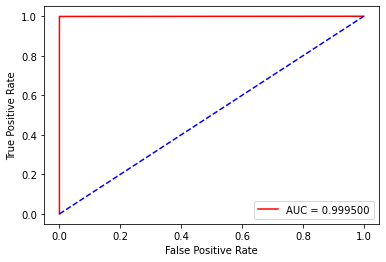

roc Area Under The Curve:  0.9995


In [46]:
 #Calculate ROC and AUC
from sklearn.metrics import roc_curve, auc
falsePosRate, truePosRate, threshold = roc_curve(trainY, trainPredictions)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)


In [47]:
#Fitting the model on test data

testPredictions = xgbClassifierWithChoosenAlpha.predict(testX)
testAccuracy = accuracy_score(testY, testPredictions)
testError = 1 - testAccuracy
confusionMatrix = confusion_matrix(testY, testPredictions)

print("Train accuracy:", testAccuracy)

print("Train error:", testError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.9940625
Train error: 0.00593750000000004
Confusion matrix:
[[15611    14]
 [   81   294]]


In [48]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(testY, testPredictions)[0][1] + confusion_matrix(testY, testPredictions)[1][0])/len(testY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.0059375


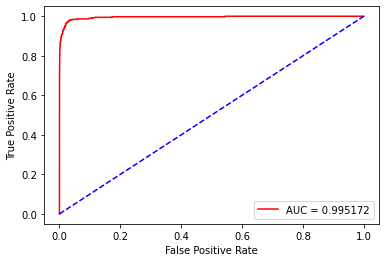

roc Area Under The Curve:  0.9951716693333333


In [49]:
 #Calculate ROC and AUC 
from sklearn.metrics import roc_curve, auc    

probPredict = xgbClassifierWithChoosenAlpha.predict_proba(testX)

falsePosRate, truePosRate, threshold = roc_curve(testY, probPredict[:, 1], pos_label=1)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)

<h4>(f) Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance.

In [50]:
#Applying the SMOTE the right way (wrong way is to apply is before CV)
from sklearn.preprocessing import MinMaxScaler
pipeline = imbpipeline(steps = [['smote', SMOTE(random_state=11)],
                                ['scaler', MinMaxScaler()],
                                ['classifier', XGBClassifier(objective='binary:logistic', random_state=11)]])

alphas = [10, 5, 1, 0.1, 0.01, 0]
k5Fold = KFold(n_splits = 5)

gridSCV = GridSearchCV(pipeline, {'classifier__reg_alpha': alphas}, cv = k5Fold, scoring="roc_auc", n_jobs=-1)

In [51]:
gridSCV.fit(trainX, trainY)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[['smote', SMOTE(random_state=11)],
                                       ['scaler', MinMaxScaler()],
                                       ['classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_met...
                                                      max_bin=None,
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=11,
                                                      reg_alpha=None,
                                                      reg_lambda=None, ...)]]),
             n_jobs=-1,
             param_grid={'classifier__reg_alpha': [10, 5, 1, 0.1, 0.01, 0]},
             scoring='roc_auc')

In [52]:
#Get best alpha
bestAlpha = gridSCV.best_params_['classifier__reg_alpha']
bestAlpha

1

In [53]:
#modeling again with alpha as 1

pipeline = imbpipeline(steps = [['smote', SMOTE(random_state=11)],
                                ['scaler', MinMaxScaler()],
                                ['classifier', XGBClassifier(objective='binary:logistic', random_state=11, alpha = bestAlpha)]])

In [54]:
pipeline.fit(trainX, trainY)

Pipeline(steps=[('smote', SMOTE(random_state=11)), ('scaler', MinMaxScaler()),
                ['classifier',
                 XGBClassifier(alpha=1, base_score=0.5, booster='gbtree',
                               callbacks=None, colsample_bylevel=1,
                               colsample_bynode=1, colsample_bytree=1,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               gamma=0, gpu_id=-1, grow_policy='depthwise',
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.300000012, max_bin=256,
                               max_cat_to_onehot=4, max_delta_step=0,
                               max_depth=6, max_leaves=0, min_child_weight=1,
                               missing=nan, monotone_constraints='()',
                               n_estimators=100, n_jobs=0, num_parallel_tree=1,
                               predictor='auto', random_state=11, reg_alpha=1, ...)]])

In [55]:
#Get train accuracy and error
trainPredictions = pipeline.predict(trainX)
trainAccuracy = accuracy_score(trainY, trainPredictions)
trainError = 1 - trainAccuracy
confusionMatrix = confusion_matrix(trainY, trainPredictions)

print("Train accuracy:", trainAccuracy)

print("Train error:", trainError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.9999666666666667
Train error: 3.333333333332966e-05
Confusion matrix:
[[59000     0]
 [    2   998]]


In [56]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(trainY, trainPredictions)[0][1] + confusion_matrix(trainY, trainPredictions)[1][0])/len(trainY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  3.3333333333333335e-05


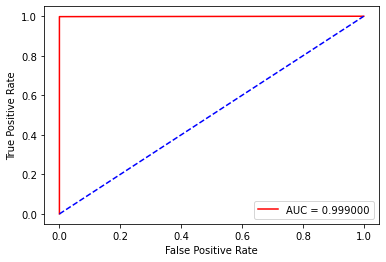

roc Area Under The Curve:  0.999


In [57]:
 #Calculate ROC and AUC
from sklearn.metrics import roc_curve, auc
falsePosRate, truePosRate, threshold = roc_curve(trainY, trainPredictions)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)


In [58]:
#Fitting the model on test data

testPredictions = pipeline.predict(testX)
testAccuracy = accuracy_score(testY, testPredictions)
testError = 1 - testAccuracy
confusionMatrix = confusion_matrix(testY, testPredictions)

print("Train accuracy:", testAccuracy)

print("Train error:", testError)

print("Confusion matrix:")

print(confusionMatrix)

Train accuracy: 0.9925625
Train error: 0.007437499999999986
Confusion matrix:
[[15573    52]
 [   67   308]]


In [59]:
#calulate missclassification rate
trainMissclassificationRate = (confusion_matrix(testY, testPredictions)[0][1] + confusion_matrix(testY, testPredictions)[1][0])/len(testY)

print("Missclassification rate: ",trainMissclassificationRate)

Missclassification rate:  0.0074375


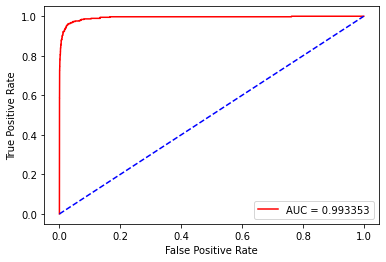

roc Area Under The Curve:  0.9933532159999999


In [60]:
 #Calculate ROC and AUC 
from sklearn.metrics import roc_curve, auc    

probPredict = pipeline.predict_proba(testX)

falsePosRate, truePosRate, threshold = roc_curve(testY, probPredict[:, 1], pos_label=1)

rocAreaUnderTheCurve = auc(falsePosRate, truePosRate)

plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')

plt.plot(falsePosRate, truePosRate, label = 'AUC = %f' % rocAreaUnderTheCurve, color='red')

plt.legend()

plt.plot([0, 1], [0, 1], color='blue',linestyle='--')

plt.show()

print("roc Area Under The Curve: ",rocAreaUnderTheCurve)

<h3>2. ISLR 6.6.3

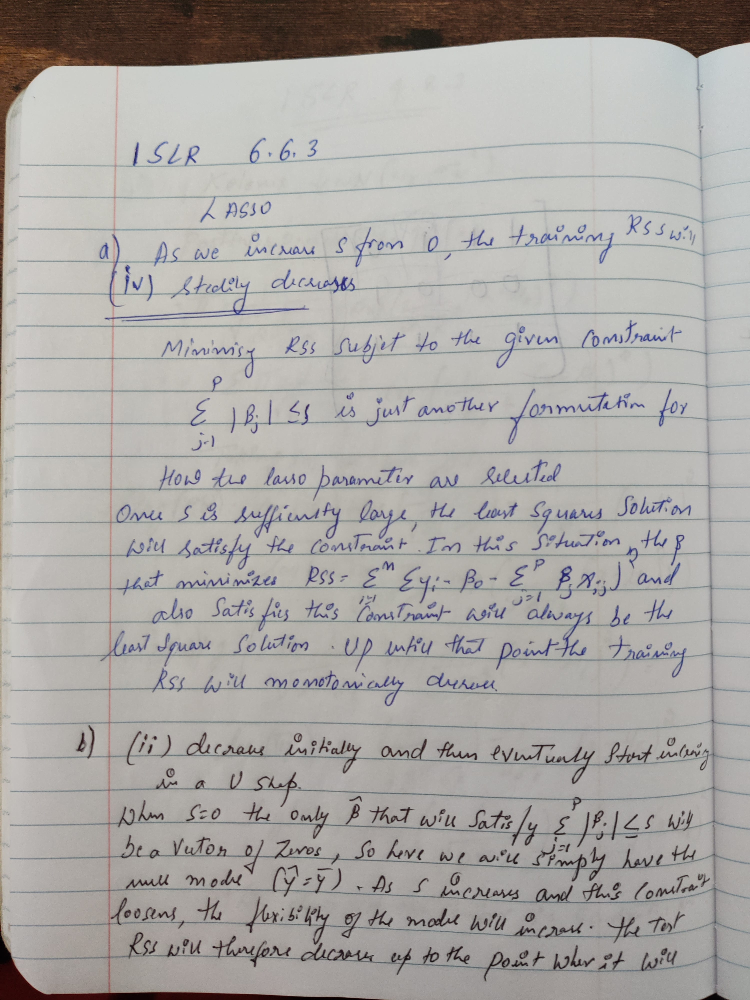

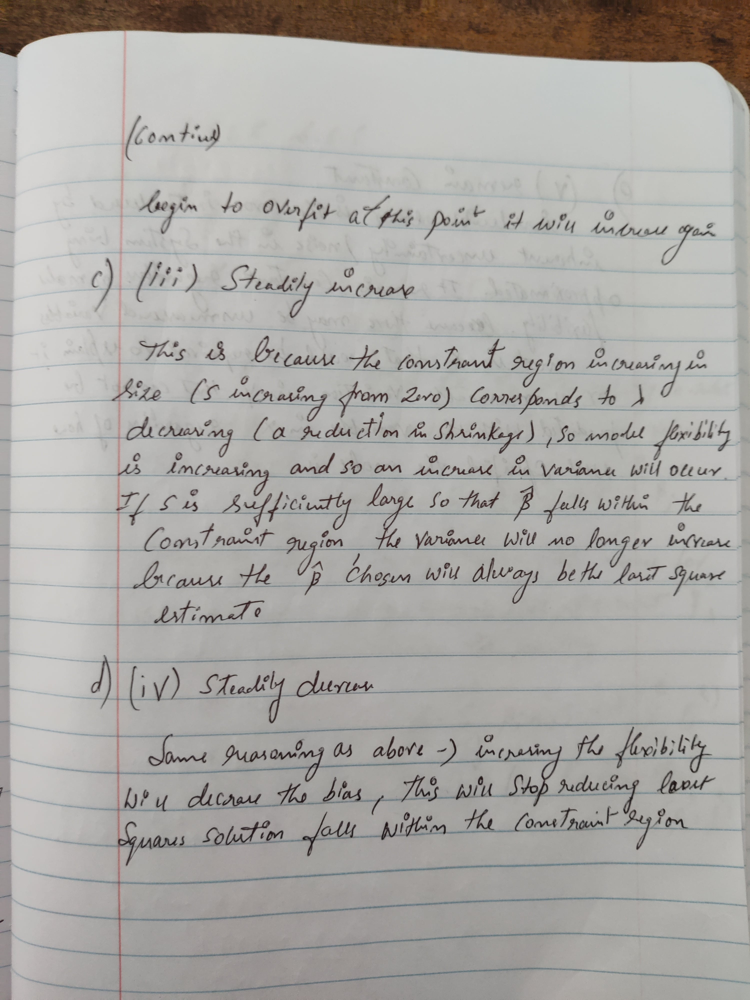

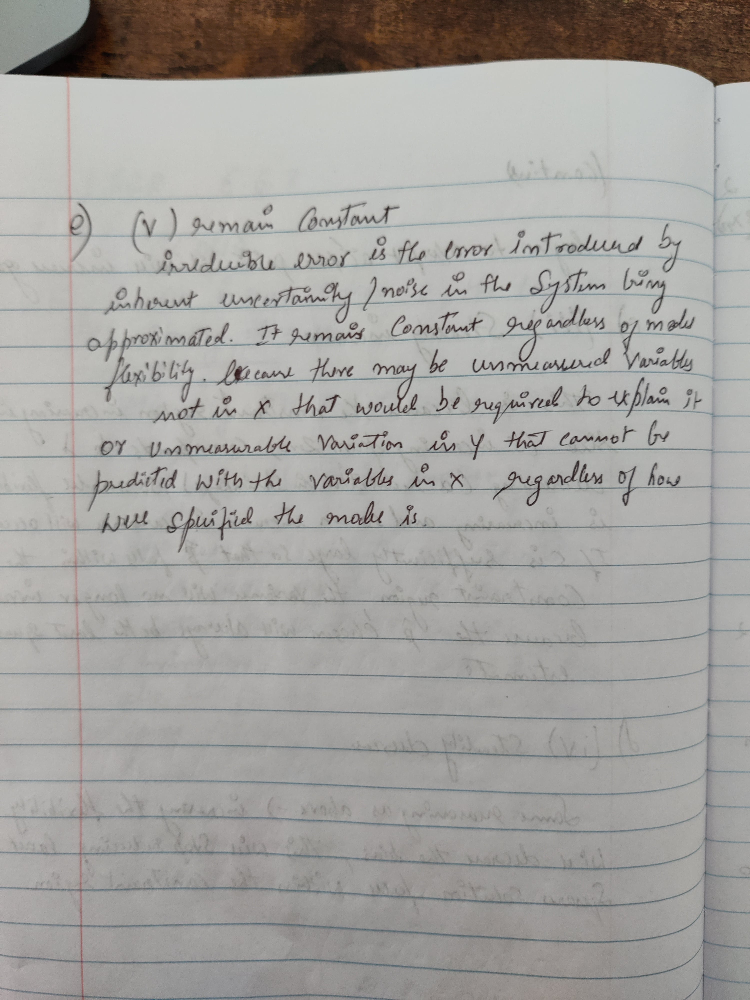

<h3>3. ISLR, 6.6.5

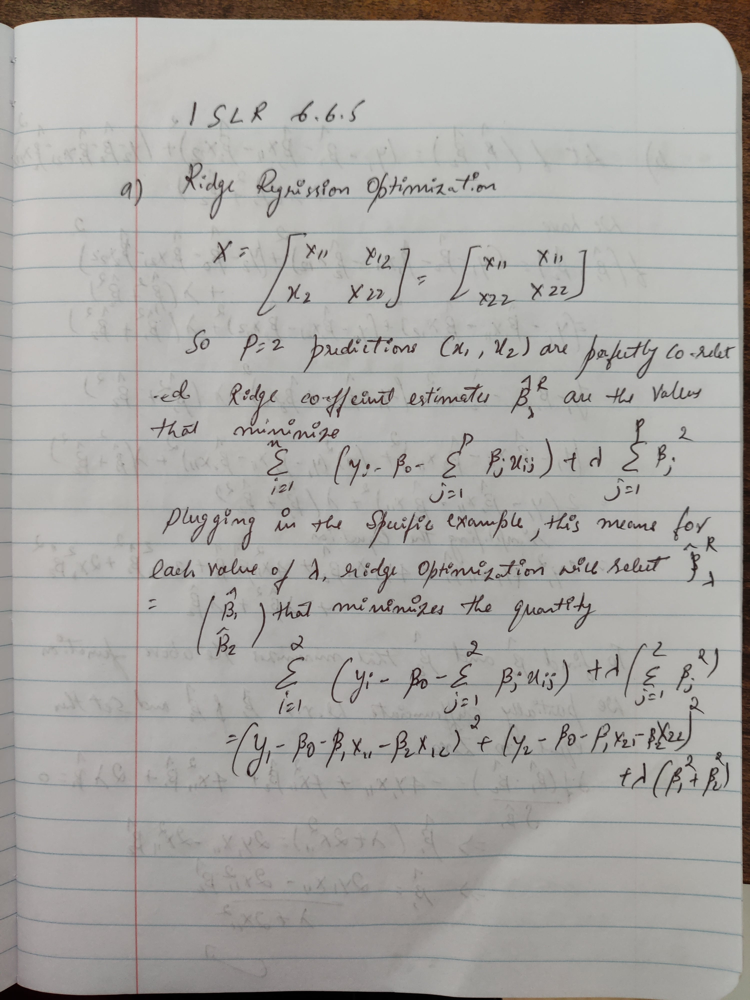

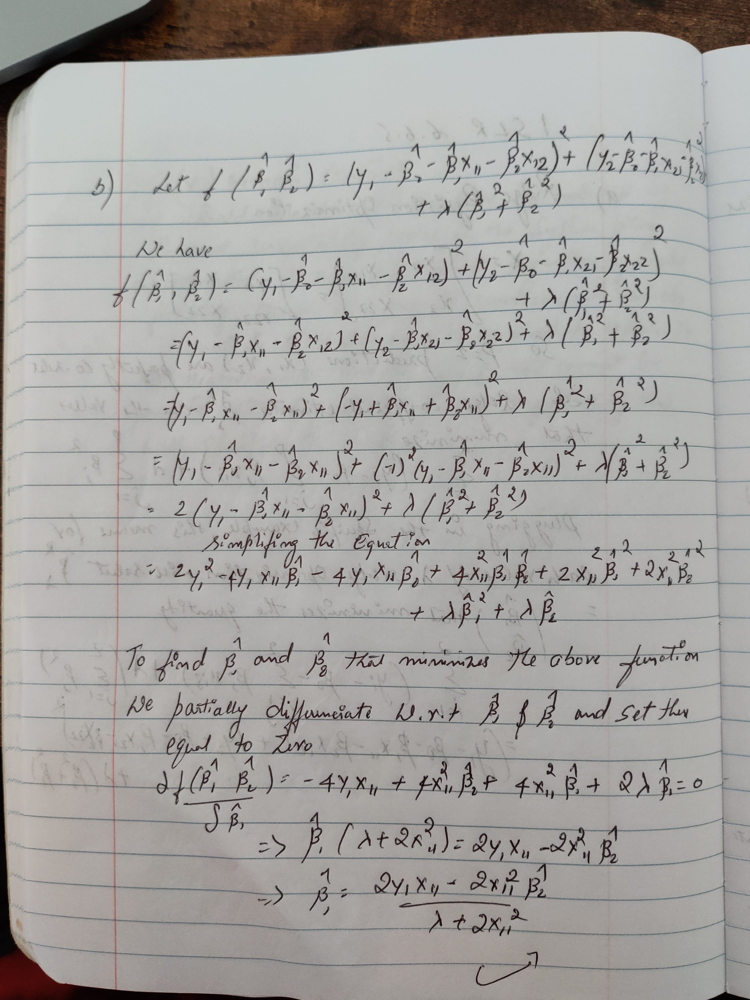

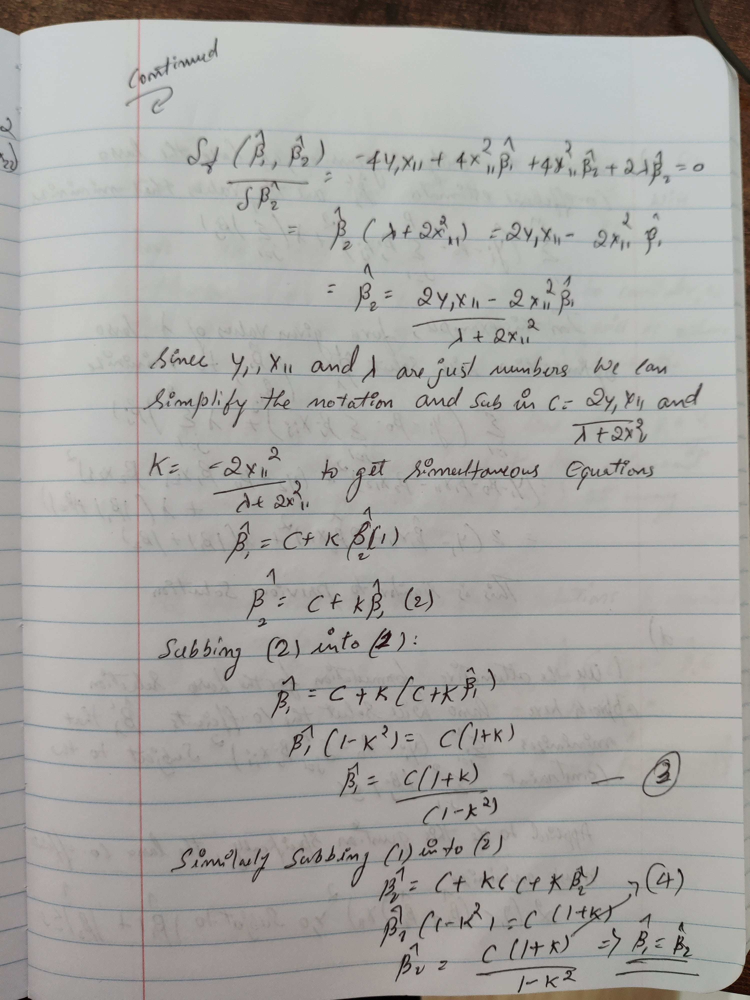

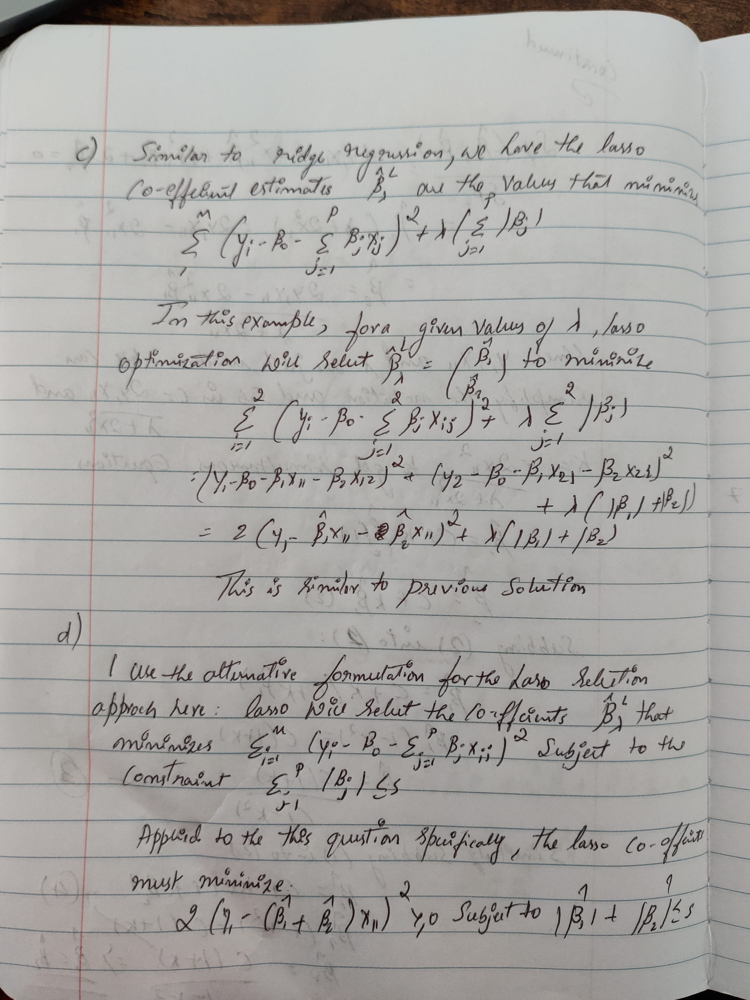

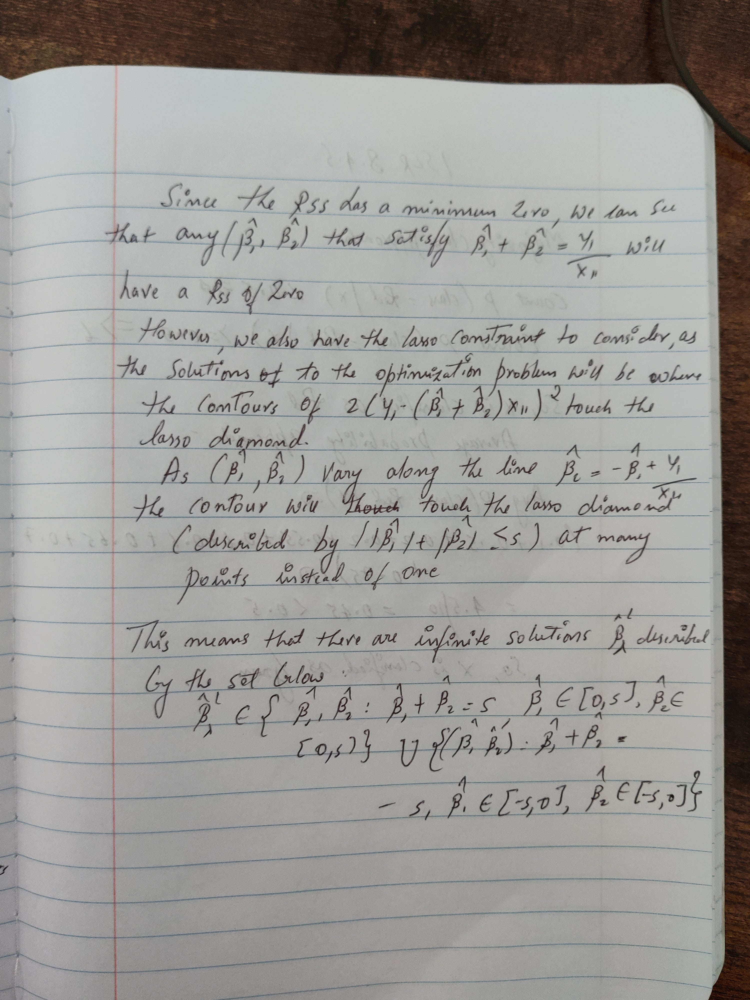

<h3>4. ISLR 8.4.5

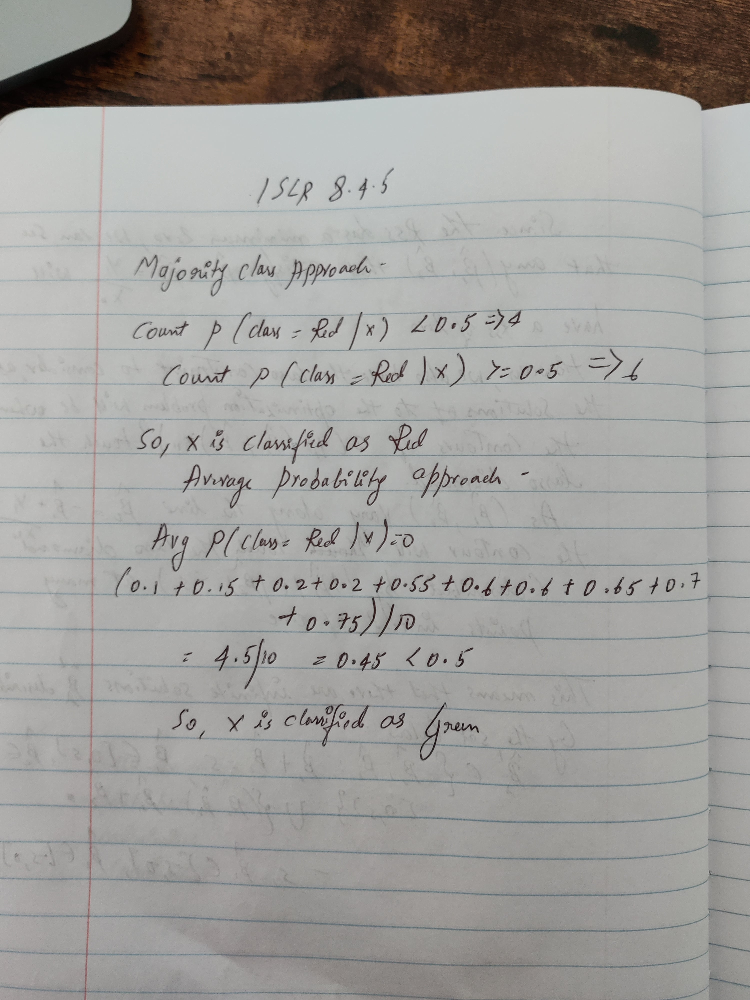

<h3> 5. ISLR 9.7.3

<h4>(a) We are given n = 7 observations in p = 2 dimensions. For each observation, there is an associated class label.
<br>Obs. X1 X2 Y<br>
     1 3 4 Red<br>
        2 2 2 Red <br>3 4 4 Red <br>4 1 4 Red <br>5 2 1 Blue<br> 6 4 3 Blue <br>7 4 1 Blue<br>
Sketch the observations.

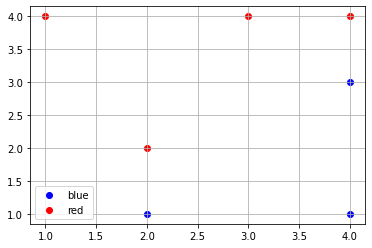

In [61]:
y = np.array([1,1,1,1,0,0,0])

x = np.array([[3,4], [2,2], [4,4], [1,4], [2,1], [4,3], [4,1]])

plt.scatter(x[y == 0,0], x[y == 0,1], color ='blue', label='blue')

plt.scatter(x[y == 1,0], x[y == 1,1], color ='red', label='red')


plt.grid(True)
plt.legend()
plt.show()

<h4>(b) Sketch the optimal separating hyperplane, and provide the equa- tion for this hyperplane

To equally devide the classes in the place we need to draw the line that passes in the middle of (2,2) and (2,1) and also(4,4) and (4,3). With this points equation of hyperplane x1-x2 = 0.5

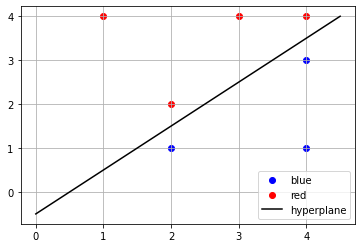

In [62]:
y = np.array([1,1,1,1,0,0,0])

x = np.array([[3,4], [2,2], [4,4], [1,4], [2,1], [4,3], [4,1]])

plt.scatter(x[y == 0,0], x[y == 0,1], color ='blue', label='blue')

plt.scatter(x[y == 1,0], x[y == 1,1], color ='red', label='red')

plt.grid(True)

plane = np.linspace(0, 4.5, 100)

plt.plot(plane, plane - 0.5, color='black', label='hyperplane')

plt.legend()

plt.show()



<h4>(c) Describe the classification rule for the maximal margin classifier. It should be something along the lines of “Classify to Red if β0 + β1X1 + β2X2 > 0, and classify to Blue otherwise.” Provide the values for β0, β1, and β2.

For the current problem, hyperplane equation is x1 - x2 - 0.5 <0, which then translated to "classify to red if this equation holds good or else classify to blue". B0, B1 and B2 are -0.5, 1 and -1 respectively.

<h4>(d) On your sketch, indicate the margin for the maximal margin hyperplane.

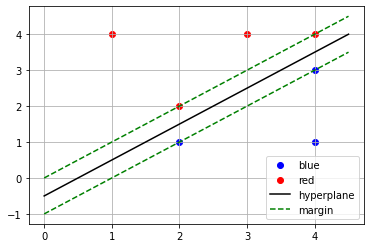

In [63]:
y = np.array([1,1,1,1,0,0,0])

x = np.array([[3,4], [2,2], [4,4], [1,4], [2,1], [4,3], [4,1]])

plt.scatter(x[y == 0,0], x[y == 0,1], color ='blue', label='blue')

plt.scatter(x[y == 1,0], x[y == 1,1], color ='red', label='red')

plt.grid(True)

plane = np.linspace(0, 4.5, 100)

plt.plot(plane, plane - 0.5, color='black', label='hyperplane')

plt.plot(plane, plane , linestyle='--', color='green', label='margin')

plt.plot(plane, plane - 1, linestyle='--', color='green')

plt.legend()

plt.show()



<h4>(e) Indicate the support vectors for the maximal margin classifier.

Support vectors for the maximal margin classifier are points (4,4), (2,1), (2,2) & (4,3) 

<h4>(f) Argue that a slight movement of the seventh observation would not affect the maximal margin hyperplane.

From the above graph we can see that the last point (4,1) is not close to the margin hyperplane and any slight changes in this point will not effect the margin (this point is not on/closer to the margin)

<h4>(g) Sketch a hyperplane that is not the optimal separating hyper- plane, and provide the equation for this hyperplane.

This can be achieved by drawing the line that passes between (2,2) and (2,1) and also (2,2) and (2,1)but not through the center of the points [(2,2) and (2,1)] or [(2,2) and (2,1)]. Equation of the one such hyperplane is X1-X2-0.3 = 0

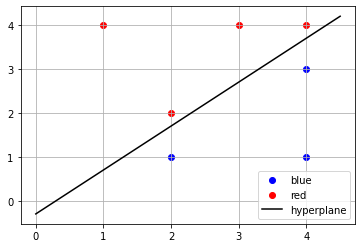

In [64]:
y = np.array([1,1,1,1,0,0,0])

x = np.array([[3,4], [2,2], [4,4], [1,4], [2,1], [4,3], [4,1]])

plt.scatter(x[y == 0,0], x[y == 0,1], color ='blue', label='blue')

plt.scatter(x[y == 1,0], x[y == 1,1], color ='red', label='red')

plt.grid(True)

plane = np.linspace(0, 4.5, 100)

plt.plot(plane, plane - 0.3, color='black', label='hyperplane')

plt.legend()

plt.show()



<h4>(h) Draw an additional observation on the plot so that the two classes are no longer separable by a hyperplane.

Adding a blue point (2.5, 3.5) to the exisiting point will make classes non separable by hyperplance

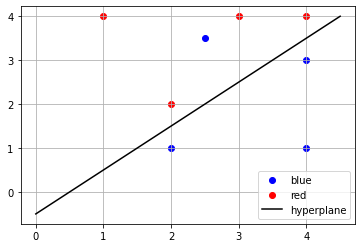

In [65]:
y = np.array([1,1,1,1,0,0,0])

x = np.array([[3,4], [2,2], [4,4], [1,4], [2,1], [4,3], [4,1]])

#Additionl point
x = np.append(x, [[2.5,3.5]], axis=0)
y = np.append(y, [0], axis=0)

plt.scatter(x[y == 0,0], x[y == 0,1], color ='blue', label='blue')

plt.scatter(x[y == 1,0], x[y == 1,1], color ='red', label='red')

plt.grid(True)

plane = np.linspace(0, 4.5, 100)

plt.plot(plane, plane - 0.5, color='black', label='hyperplane')

plt.legend()

plt.show()



<h3> References

https://towardsdatascience.com/4-techniques-to-deal-with-missing-data-in-datasets-841f8a303395
https://datatofish.com/correlation-matrix-pandas/
https://stackoverflow.com/questions/29432629/plot-correlation-matrix-using-pandas
https://towardsdatascience.com/the-right-way-of-using-smote-with-cross-validation-92a8d09d00c7